In [ ]:
'''
rough notebook testing different values and parameters for Lucid
'''

In [1]:
import numpy as np
import tensorflow as tf
import os, argparse
import cv2
import lucid.optvis.objectives as objectives
import lucid.optvis.param as param
import lucid.optvis.render as render
import lucid.optvis.transform as transform

from lucid.misc.io import show
from lucid.modelzoo.vision_models import Model
from lucid_load_model import CovidNetB

#suppress warnings from tensorflow
from tensorflow.python.util import deprecation
deprecation._PRINT_DEPRECATION_WARNINGS = False

In [2]:
#suppress warnings from tensorflow
from tensorflow.python.util import deprecation
deprecation._PRINT_DEPRECATION_WARNINGS = False

model = CovidNetB()
model.load_graphdef()

500 -52.483532



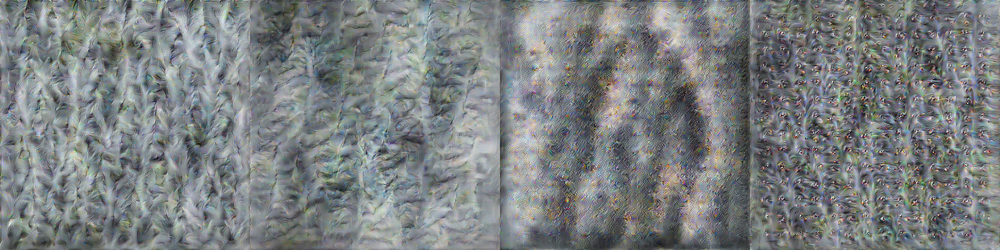

In [16]:
#optimizaing for 'normal' class with diversity
obj = objectives.class_logit("norm_dense_1/Softmax", 0) - 1e2*objectives.diversity("conv5_block3_out/add")
param_f = lambda: param.image(480, batch=4)
_ = render.render_vis(model, obj, param_f, transforms=[], thresholds=[500])

500 -50.76051



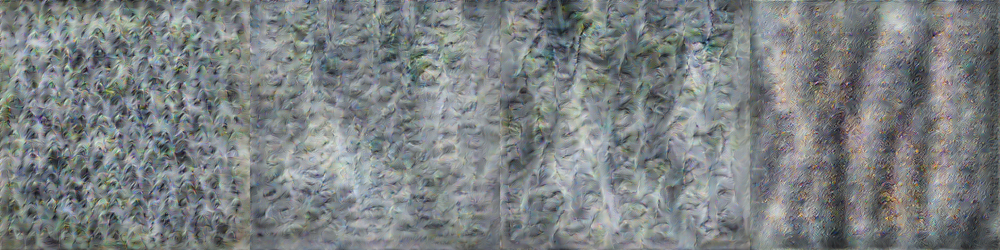

In [15]:
obj = objectives.class_logit("norm_dense_1/Softmax", 1) - 1e2*objectives.diversity("conv5_block3_out/add")
param_f = lambda: param.image(480, fft=True, batch=4)
_ = render.render_vis(model, obj, param_f, transforms=[], thresholds=[500])

500 -49.62178



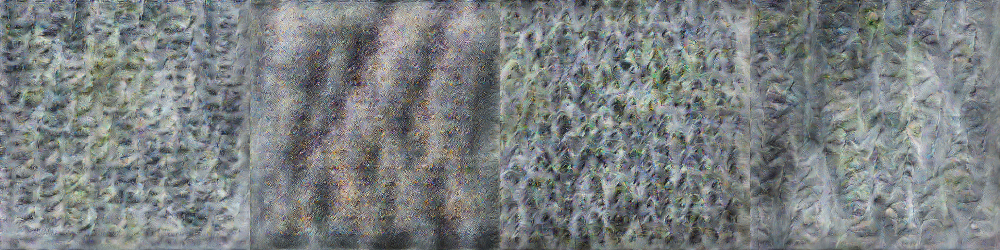

In [10]:
obj = objectives.class_logit("norm_dense_1/Softmax", 2) - 1e2*objectives.diversity("conv5_block3_out/add")
param_f = lambda: param.image(480, batch=4)
_ = render.render_vis(model, obj, param_f, transforms=[], thresholds=[500])

10 4.3912916



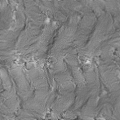

20 6.071551



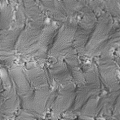

30 5.913457



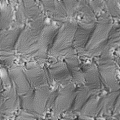

50 7.140819



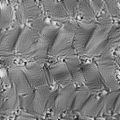

100 8.8223295



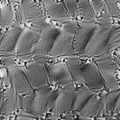

200 7.6563005



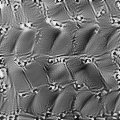

In [4]:
#Finding optimal number of iterations for optimization (point of diminishing returns)
param_f = lambda: tf.tile(tf.math.reduce_mean(param.image(120, fft=True), axis=3, keepdims=True), [1,1,1,3])
obj = objectives.channel("conv5_block3_out/add", 1596)
_ = render.render_vis(model, obj, param_f, transforms = transform.standard_transforms, thresholds=[10,20,30,50,100,200,])

10 -1.9808514



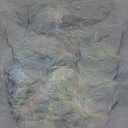

100 -0.7451218



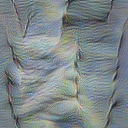

1000 -0.85228235



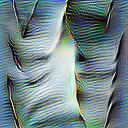

In [11]:
#negative optimization
param_f = lambda: tf.tile(tf.math.reduce_mean(param.image(120, fft=True), axis=3, keepdims=True), [1,1,1,3])
obj = objectives.channel("conv5_block3_out/add", 821)
_ = render.render_vis(model, obj, thresholds=[10,100,1000])

512 -91.414856



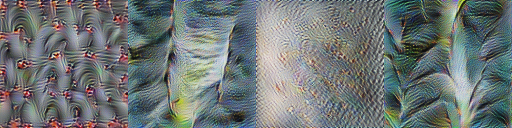

In [12]:
#diversity optimization on channels
param_f = lambda: param.image(128, batch=4)
obj = objectives.channel("conv5_block3_out/add", 1596) - 1e2*objectives.diversity("conv5_block3_out/add")
_ = render.render_vis(model, obj, param_f)

512 6.704629



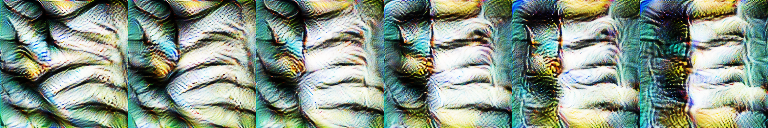

In [21]:
#interpolating between neurons
def interpolate_param_f():
    unique = param.fft_image((6, 128, 128, 3))
    shared = [
        param.lowres_tensor((6, 128, 128, 3), (1, 128//2, 128//2, 3)),
        param.lowres_tensor((6, 128, 128, 3), (1, 128//4, 128//4, 3)),
        param.lowres_tensor((6, 128, 128, 3), (1, 128//8, 128//8, 3)),
        param.lowres_tensor((6, 128, 128, 3), (2, 128//8, 128//8, 3)),
        param.lowres_tensor((6, 128, 128, 3), (1, 128//16, 128//16, 3)),
        param.lowres_tensor((6, 128, 128, 3), (2, 128//16, 128//16, 3)),
    ]
    return param.to_valid_rgb(unique + sum(shared), decorrelate=True)

obj = objectives.channel_interpolate('conv5_block3_out/add', 0, 'conv5_block3_out/add', 1)

_ = render.render_vis(model, obj, interpolate_param_f)

1 1.6799731



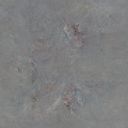

32 7.14672



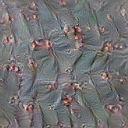

128 9.297987



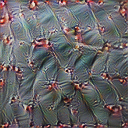

256 10.107853



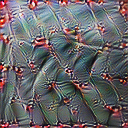

In [ ]:
#testing effectiveness of different transforms
JITTER = 2
ROTATE = 5
SCALE  = 1.5

transforms = [
    transform.pad(2*JITTER),
    transform.jitter(JITTER),
    transform.random_scale([SCALE ** (n/10.) for n in range(-10, 11)]),
    transform.random_rotate(range(-ROTATE, ROTATE+1))
]

_ = render.render_vis(model, "conv5_block3_out/add:1596", transforms=transforms,
                         param_f=lambda: param.image(128), 
                         thresholds=(1, 32, 128, 256, 2048))
